# Proyek Klasifikasi Gambar: Crop Diseases Classification

- **Nama:** Khadijatul Kubro
- **Email:** m197d5x0961@student.devacademy.id
- **ID Dicoding:** M197D5X0961

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/multi-cancer/README.md
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1737.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3648.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3082.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_4567.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0955.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1226.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_1326.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_0555.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical Cancer/cervix_koc/cervix_koc_3821.jpg
/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Cervical C

# Import Semua Packages/Library yang Digunakan

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from PIL import Image
import pandas as pd
import numpy as np
import keras
import warnings
warnings.filterwarnings(action="ignore")
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras import backend as K

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import TensorBoard,EarlyStopping, ReduceLROnPlateau

import sklearn.metrics as metrics
from keras.callbacks import LearningRateScheduler
annealer = LearningRateScheduler(lambda x: 1e-3 * 0.95 ** x, verbose=0)

# Data Preparation

**Data loading**

In [5]:
brain_glioma_dir = r'/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Brain Cancer/brain_glioma'
brain_menin_dir = r'/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Brain Cancer/brain_menin'
brain_tumor_dir = r'/kaggle/input/multi-cancer/Multi Cancer/Multi Cancer/Brain Cancer/brain_tumor'

filepaths = []
labels = []
dict_list = [brain_glioma_dir, brain_menin_dir, brain_tumor_dir]
class_labels = ['brain glioma', 'brain menin', 'brain tumor']

for i, j in enumerate(dict_list):
    flist = os.listdir(j)
    for f in flist:
        fpath = os.path.join(j, f)
        filepaths.append(fpath)
        labels.append(class_labels[i])

Fseries = pd.Series(filepaths, name="filepaths")
Lseries = pd.Series(labels, name="labels")
brain_cancer_data = pd.concat([Fseries, Lseries], axis=1)
brain_cancer_df = pd.DataFrame(brain_cancer_data)
print(brain_cancer_df.head())
print(brain_cancer_df["labels"].value_counts())

                                           filepaths        labels
0  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  brain glioma
1  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  brain glioma
2  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  brain glioma
3  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  brain glioma
4  /kaggle/input/multi-cancer/Multi Cancer/Multi ...  brain glioma
labels
brain glioma    5000
brain menin     5000
brain tumor     5000
Name: count, dtype: int64


In [6]:
brain_cancer_df.shape

(15000, 2)

**Splitting Data**

In [7]:
train_images, temp_images = train_test_split(brain_cancer_df, test_size=0.2, random_state=42)
test_images, val_images = train_test_split(temp_images, test_size=0.5, random_state=42)

In [8]:
print(train_images.shape)
print(test_images.shape)
print(val_images.shape)

(12000, 2)
(1500, 2)
(1500, 2)


**Image Augmentation**

In [9]:
TARGET_SIZE = (224, 224)
BATCH_SIZE = 32

image_gen = ImageDataGenerator(preprocessing_function= tf.keras.applications.mobilenet_v2.preprocess_input)
train = image_gen.flow_from_dataframe(dataframe= train_images,x_col="filepaths",y_col="labels",
                                      target_size=TARGET_SIZE,
                                      color_mode='rgb',
                                      class_mode="categorical", 
                                      batch_size=BATCH_SIZE,
                                      shuffle=False           
                                     )
test = image_gen.flow_from_dataframe(dataframe= test_images,x_col="filepaths", y_col="labels",
                                     target_size=TARGET_SIZE,
                                     color_mode='rgb',
                                     class_mode="categorical",
                                     batch_size=BATCH_SIZE,
                                     shuffle= False
                                    )
val = image_gen.flow_from_dataframe(dataframe= val_images,x_col="filepaths", y_col="labels",
                                    target_size=TARGET_SIZE,
                                    color_mode= 'rgb',
                                    class_mode="categorical",
                                    batch_size=BATCH_SIZE,
                                    shuffle=False
                                   )

Found 12000 validated image filenames belonging to 3 classes.
Found 1500 validated image filenames belonging to 3 classes.
Found 1500 validated image filenames belonging to 3 classes.


In [10]:
classes=list(train.class_indices.keys())
print (classes)

['brain glioma', 'brain menin', 'brain tumor']


**Show Sample Image**

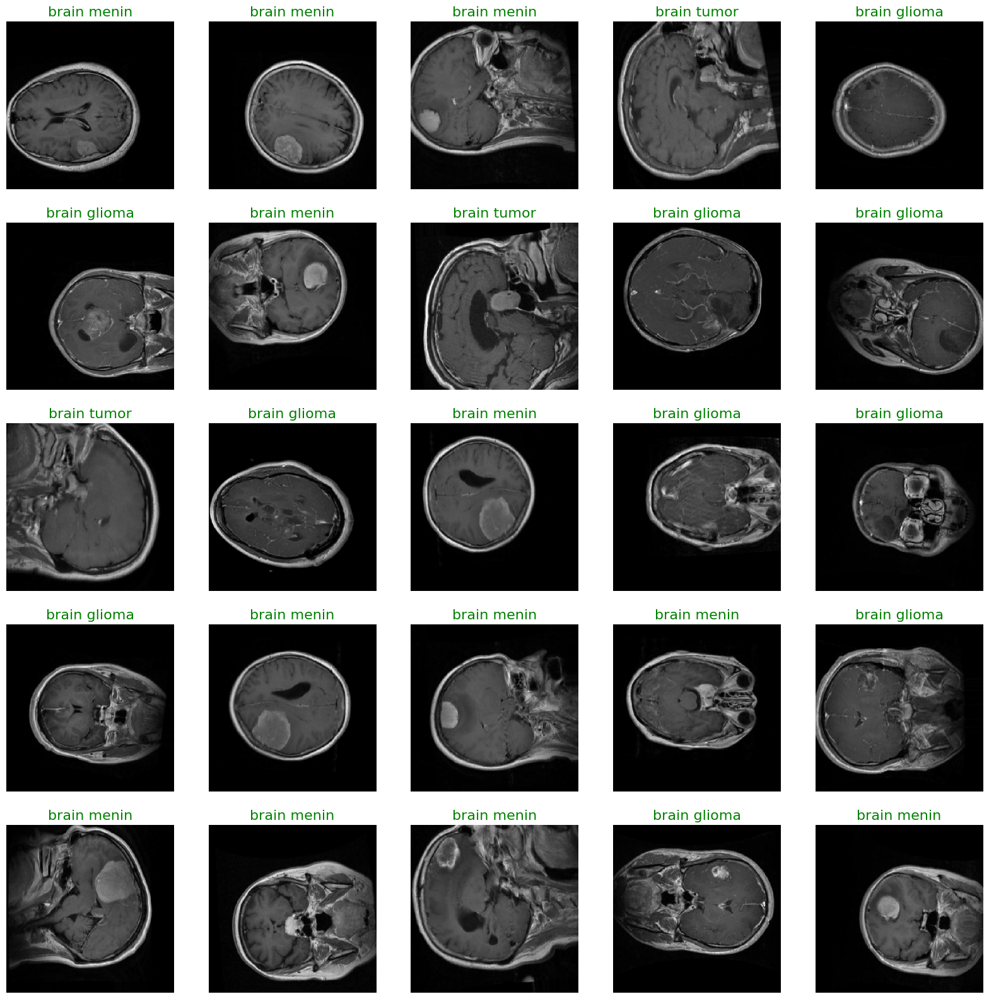

In [11]:
def show_brain_cancer_images(image_gen):
    test_dict = test.class_indices
    classes = list(test_dict.keys())
    images, labels=next(image_gen) 
    plt.figure(figsize=(20,20))
    length = len(labels)
    if length<25:
        r=length
    else:
        r=25
    for i in range(r):
        plt.subplot(5,5,i+1)
        image=(images[i]+1)/2 
        plt.imshow(image)
        index=np.argmax(labels[i])
        class_name=classes[index]
        plt.title(class_name, color="green",fontsize=16)
        plt.axis('off')
    plt.show()

show_brain_cancer_images(train)

# Modelling

In [12]:
model = Sequential([
    # Block 1
    Conv2D(128, (8, 8), activation='relu', padding='same', input_shape=(224, 224, 3)),
    BatchNormalization(),
    Conv2D(128, (5, 5), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    
    # Block 2
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(256, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    
    # Block 3
    Conv2D(512, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(512, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    
    # Block 4
    Conv2D(512, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    Conv2D(512, (3, 3), activation='relu', padding='same'),
    BatchNormalization(),
    MaxPooling2D((2, 2)),
    
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(3, activation='softmax')
])

model.compile(
    optimizer=SGD(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

I0000 00:00:1764538723.919661      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1764538723.920354      47 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 128)  │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 128)  │       409,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 256)  │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 256)  │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 256)  │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 256)  │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 28, 28, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             

 Total params: 113,404,675 (432.60 MB)

 Trainable params: 113,399,043 (432.58 MB)

 Non-trainable params: 5,632 (22.00 KB)

In [13]:
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

In [14]:
history = model.fit(
    train,
    epochs=30,
    validation_data=val,
    callbacks=early_stopping,
    validation_freq=1
)

Epoch 1/30


I0000 00:00:1764538736.793645     121 service.cc:148] XLA service 0x7ab7080128f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764538736.794988     121 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1764538736.795013     121 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1764538737.271180     121 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-11-30 21:39:04.928271: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[32,128,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,128,224,224]{3,2,1,0}, f32[128,128,5,5]{3,2,1,0}, f32[128]{0}), window={size=5x5 pad=2_2x2_2}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earl

375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6074 - loss: 1.2408

2025-11-30 21:47:25.201367: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng20{k2=2,k4=1,k5=0,k6=0,k7=0,k19=0} for conv (f32[32,128,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,128,224,224]{3,2,1,0}, f32[128,128,5,5]{3,2,1,0}, f32[128]{0}), window={size=5x5 pad=2_2x2_2}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2025-11-30 21:47:25.338981: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.137697838s
Trying algorithm eng20{k2=2,k4=1,k5=0,k6=0,k7=0,k19=0} for conv (f32[32,128,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,128,224,224]{3,2,1,0}, f32[128,128,5,5]{3,2,1,0}, f32[128]{0}), window={size=5x5 pad=2_2x2_2}, dim_labels=bf01_oi01->b

375/375 ━━━━━━━━━━━━━━━━━━━━ 583s 1s/step - accuracy: 0.6076 - loss: 1.2398 - val_accuracy: 0.6260 - val_loss: 1.0934
Epoch 2/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 432s 1s/step - accuracy: 0.7600 - loss: 0.5959 - val_accuracy: 0.8113 - val_loss: 0.4508
Epoch 3/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 431s 1s/step - accuracy: 0.8057 - loss: 0.4827 - val_accuracy: 0.7627 - val_loss: 0.5848
Epoch 4/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 432s 1s/step - accuracy: 0.8390 - loss: 0.4052 - val_accuracy: 0.8593 - val_loss: 0.3817
Epoch 5/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 431s 1s/step - accuracy: 0.8681 - loss: 0.3416 - val_accuracy: 0.8760 - val_loss: 0.2941
Epoch 6/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 433s 1s/step - accuracy: 0.8947 - loss: 0.2769 - val_accuracy: 0.8980 - val_loss: 0.2639
Epoch 7/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 433s 1s/step - accuracy: 0.9173 - loss: 0.2229 - val_accuracy: 0.9173 - val_loss: 0.2256
Epoch 8/30
375/375 ━━━━━━━━━━━━━━━━━━━━ 432s 1s/step - accuracy: 0.9287 - loss: 0.1843 - val_accuracy: 0.759

# Evaluasi dan Visualisasi

In [15]:
model.evaluate(test, verbose=1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 17s 358ms/step - accuracy: 0.9664 - loss: 0.1330


[0.13019077479839325, 0.9646666646003723]

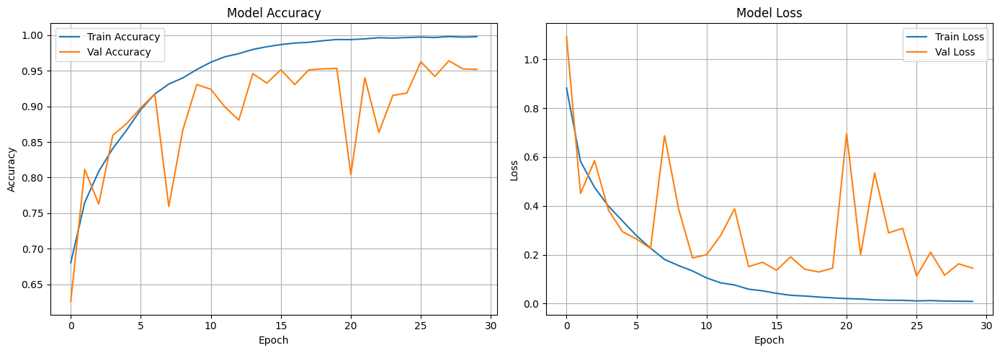

In [16]:
plt.figure(figsize=(14, 5))
plt.subplot(1, 2, 1)

plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Konversi Model

In [17]:
os.makedirs("/kaggle/working/submission/tfjs_model", exist_ok=True)
os.makedirs("/kaggle/working/submission/tflite", exist_ok=True)
os.makedirs("/kaggle/working/submission/saved_model/variables", exist_ok=True)

**Saved model**

In [18]:
model.export("/kaggle/working/submission/saved_model")

INFO:tensorflow:Assets written to: /kaggle/working/submission/saved_model/assets


INFO:tensorflow:Assets written to: /kaggle/working/submission/saved_model/assets


Saved artifact at '/kaggle/working/submission/saved_model'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor')
Output Type:
  TensorSpec(shape=(None, 3), dtype=tf.float32, name=None)
Captures:
  134929694431312: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694433040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694434192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694434576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694430928: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694433808: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694433232: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694435152: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694435344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  134929694434768: TensorSpec(shape=(), dtype=tf.resource, name=

In [19]:
ls -R /kaggle/working/submission/saved_model

/kaggle/working/submission/saved_model:
assets/  fingerprint.pb  saved_model.pb  variables/

/kaggle/working/submission/saved_model/assets:

/kaggle/working/submission/saved_model/variables:
variables.data-00000-of-00001  variables.index


**TF-Lite**

In [20]:
converter = tf.lite.TFLiteConverter.from_saved_model("/kaggle/working/submission/saved_model")
tflite_model = converter.convert()

with open("/kaggle/working/submission/tflite/model.tflite", "wb") as f:
    f.write(tflite_model)

with open("/kaggle/working/submission/tflite/label.txt", "w") as f:
    for i,label in enumerate(class_labels):
        f.write(f"{i} {label}\n")

W0000 00:00:1764552153.740466      47 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1764552153.740535      47 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1764552153.767285      47 mlir_graph_optimization_pass.cc:401] MLIR V1 optimization pass is not enabled


In [21]:
ls -R /kaggle/working/submission/tflite

/kaggle/working/submission/tflite:
label.txt  model.tflite


**TFJS**

In [22]:
!pip install tensorflowjs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.9/319.9 kB 11.9 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 6.33.0
    Uninstalling protobuf-6.33.0:
      Successfully uninstalled protobuf-6.33.0
  Attempting uninstall: packaging
    Found existing installation: packaging 25.0
    Uninstalling packaging-25.0:
      Successfully uninstalled packaging-25.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
google-cloud-translate 3.12.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.19.5, but you have protobuf 5.29.5 

In [23]:
model.save("model.h5")

In [24]:
# pastikan folder output kosong
!rm -rf /kaggle/working/submission/tfjs_model
!mkdir -p /kaggle/working/submission/tfjs_model

# convert SavedModel → TFJS
!tensorflowjs_converter --input_format=keras model.h5 /kaggle/working/submission/tfjs_model

2025-12-01 01:27:02.715989: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764552422.736217     859 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764552422.742384     859 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
failed to lookup keras version from the file,
    this is likely a weight only file


In [25]:
!ls -R /kaggle/working/submission/tfjs_model

/kaggle/working/submission/tfjs_model:
group1-shard100of109.bin  group1-shard35of109.bin  group1-shard69of109.bin
group1-shard101of109.bin  group1-shard36of109.bin  group1-shard6of109.bin
group1-shard102of109.bin  group1-shard37of109.bin  group1-shard70of109.bin
group1-shard103of109.bin  group1-shard38of109.bin  group1-shard71of109.bin
group1-shard104of109.bin  group1-shard39of109.bin  group1-shard72of109.bin
group1-shard105of109.bin  group1-shard3of109.bin   group1-shard73of109.bin
group1-shard106of109.bin  group1-shard40of109.bin  group1-shard74of109.bin
group1-shard107of109.bin  group1-shard41of109.bin  group1-shard75of109.bin
group1-shard108of109.bin  group1-shard42of109.bin  group1-shard76of109.bin
group1-shard109of109.bin  group1-shard43of109.bin  group1-shard77of109.bin
group1-shard10of109.bin   group1-shard44of109.bin  group1-shard78of109.bin
group1-shard11of109.bin   group1-shard45of109.bin  group1-shard79of109.bin
group1-shard12of109.bin   group1-shard46of109.bin  group1-shar

In [26]:
!pip freeze > /kaggle/working/submission/requirements.txt

In [27]:
readme = """
# Model Export - Project Classification

Repository ini berisi model dalam tiga format:
| Format | Kegunaan |
|-------|----------|
| SavedModel | Standar TensorFlow (Training + Deployment) |
| TFLite | Mobile / Edge TPU Deployment |
| TFJS | Web Deployment (Browser/NodeJS) |

Referensi file:
- saved_model/ → format asli untuk inferensi
- tflite/model.tflite + label.txt untuk mobile
- tfjs_model/ untuk web

"""
with open("/kaggle/working/submission/README.md","w") as f:
    f.write(readme)


In [28]:
!cd /kaggle/working && zip -r submission.zip submission/

  adding: submission/ (stored 0%)
  adding: submission/saved_model/ (stored 0%)
  adding: submission/saved_model/variables/ (stored 0%)
  adding: submission/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: submission/saved_model/variables/variables.index (deflated 75%)
  adding: submission/saved_model/saved_model.pb (deflated 89%)
  adding: submission/saved_model/fingerprint.pb (stored 0%)
  adding: submission/saved_model/assets/ (stored 0%)
  adding: submission/tflite/ (stored 0%)
  adding: submission/tflite/label.txt (deflated 21%)
  adding: submission/tflite/model.tflite (deflated 9%)
  adding: submission/tfjs_model/ (stored 0%)
  adding: submission/tfjs_model/group1-shard42of109.bin (deflated 9%)
  adding: submission/tfjs_model/group1-shard13of109.bin (deflated 9%)
  adding: submission/tfjs_model/group1-shard108of109.bin (deflated 8%)
  adding: submission/tfjs_model/group1-shard16of109.bin (deflated 9%)
  adding: submission/tfjs_model/group1-shard93of109.